In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [7]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("imroze/floodnet-cropresized-512-wpartialmasks")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/floodnet-cropresized-512-wpartialmasks


In [8]:
import os

dataset_path = "/kaggle/input/floodnet-cropresized-512-wpartialmasks"
files = os.listdir(dataset_path)

print("Files in dataset:", files)

Files in dataset: ['mask_partial', 'mask_sam', 'mask', 'image']


In [9]:
import os

dataset_path = "/kaggle/input/floodnet-cropresized-512-wpartialmasks"
image_folder = os.path.join(dataset_path, "image")

# List available files in the folder
print("Available files:", os.listdir(image_folder))

# Verify file path
sample_image_path = os.path.join(image_folder, "7556.png")
print("Image path:", sample_image_path)

# Check if the file exists
if not os.path.exists(sample_image_path):
    print("Error: File not found!")
else:
    print("File exists! You can proceed.")


Available files: ['6692.png', '7726.png', '7418.png', '8426.png', '6595.png', '8794.png', '6978.png', '7488.png', '8146.png', '8962.png', '8658.png', '7331.png', '6812.png', '6802.png', '7791.png', '7124.png', '7050.png', '7072.png', '7825.png', '7266.png', '7965.png', '7675.png', '8956.png', '9725.png', '8594.png', '8269.png', '8336.png', '7724.png', '7884.png', '8247.png', '9724.png', '7195.png', '7202.png', '7024.png', '7982.png', '7088.png', '6727.png', '7820.png', '7556.png', '10840.png', '8141.png', '6397.png', '6555.png', '7862.png', '8288.png', '6938.png', '6682.png', '9022.png', '6953.png', '6839.png', '6860.png', '8859.png', '7102.png', '8556.png', '7879.png', '6477.png', '9061.png', '8217.png', '7330.png', '9080.png', '7646.png', '7972.png', '6832.png', '8524.png', '7362.png', '7238.png', '8351.png', '7867.png', '6585.png', '6447.png', '10811.png', '6924.png', '8165.png', '8101.png', '7003.png', '9086.png', '6512.png', '7852.png', '6540.png', '8971.png', '6651.png', '8809.pn

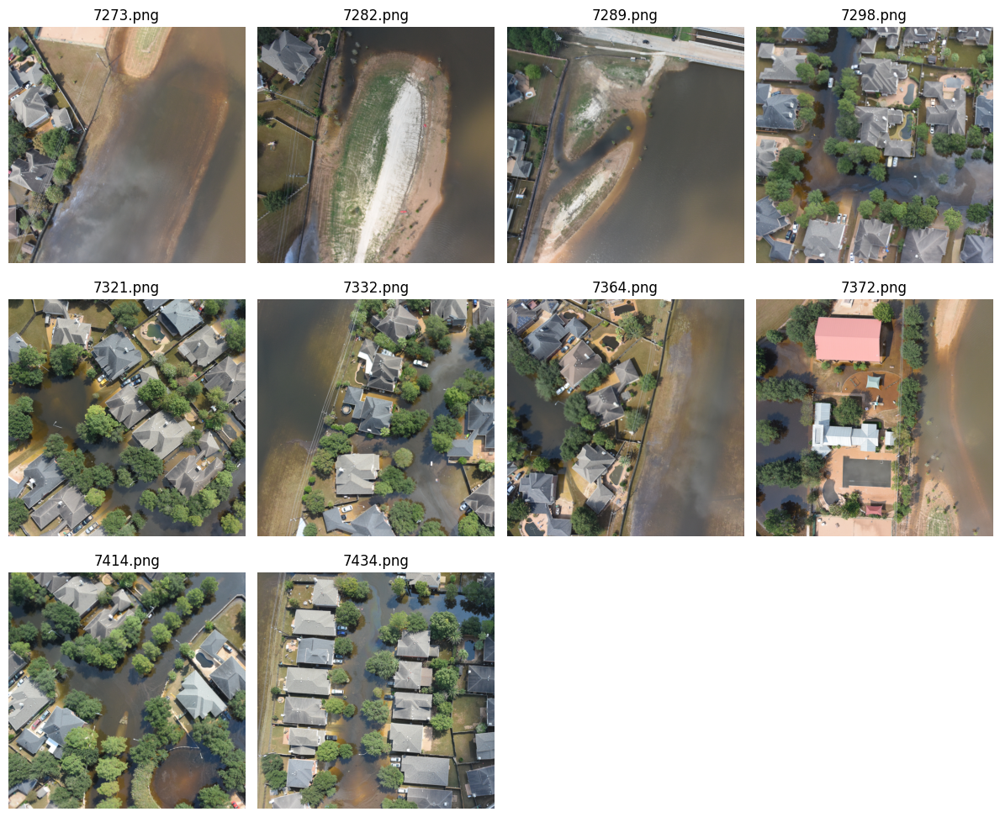

In [8]:
import os
import cv2
import matplotlib.pyplot as plt

# Define dataset path
dataset_path = "/kaggle/input/floodnet-cropresized-512-wpartialmasks"
image_folder = os.path.join(dataset_path, "image")

# List of specific image filenames (ensure these exist in your dataset)
image_filenames = ["7273.png", "7282.png", "7289.png", "7298.png", "7321.png",
                   "7332.png", "7364.png", "7372.png", "7414.png", "7434.png"]

# Display each image
plt.figure(figsize=(12, 10))
for i, img_name in enumerate(image_filenames):
    sample_image_path = os.path.join(image_folder, img_name)

    # Load image
    image = cv2.imread(sample_image_path)
    
    if image is not None:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

        # Show image in a grid
        plt.subplot(3, 4, i + 1)  # Adjust grid layout (3 rows, 4 columns)
        plt.imshow(image)
        plt.axis("off")
        plt.title(img_name)
    else:
        print(f"Error: {img_name} not found or failed to load.")

plt.tight_layout()
plt.show()

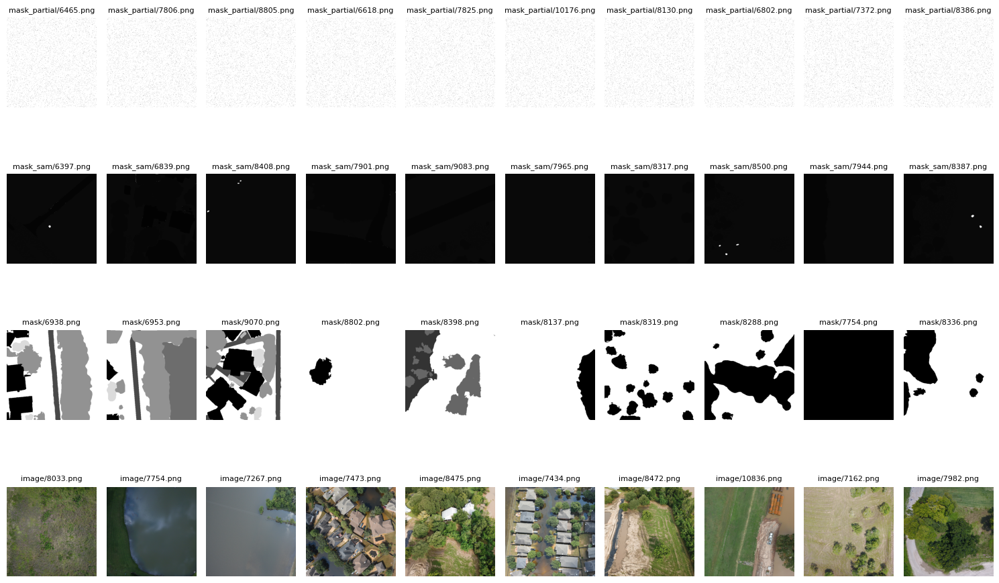

In [19]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define dataset path
dataset_path = "/kaggle/input/floodnet-cropresized-512-wpartialmasks"

# Define folder names
folders = ["mask_partial", "mask_sam", "mask", "image"]

# Number of random samples per folder
num_samples = 10

# Set figure size
plt.figure(figsize=(15, 10))

# Loop through each folder
for folder_idx, folder in enumerate(folders):
    folder_path = os.path.join(dataset_path, folder)
    
    # Get list of all files in the folder
    all_files = os.listdir(folder_path)
    
    # Randomly select 10 files
    sampled_files = random.sample(all_files, num_samples)
    
    # Loop through selected files and display them
    for img_idx, img_name in enumerate(sampled_files):
        img_path = os.path.join(folder_path, img_name)
        
        # Load image
        image = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)  # Load masks as grayscale
        
        if image is not None:
            if len(image.shape) == 3:  # Convert BGR to RGB only if it's a color image
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            
            # Display image in grid
            plt.subplot(len(folders), num_samples, folder_idx * num_samples + img_idx + 1)
            plt.imshow(image, cmap="gray" if len(image.shape) == 2 else None)
            plt.axis("off")
            plt.title(f"{folder}/{img_name}", fontsize=8)
        else:
            print(f"Error loading: {folder}/{img_name}")

plt.tight_layout()
plt.show()

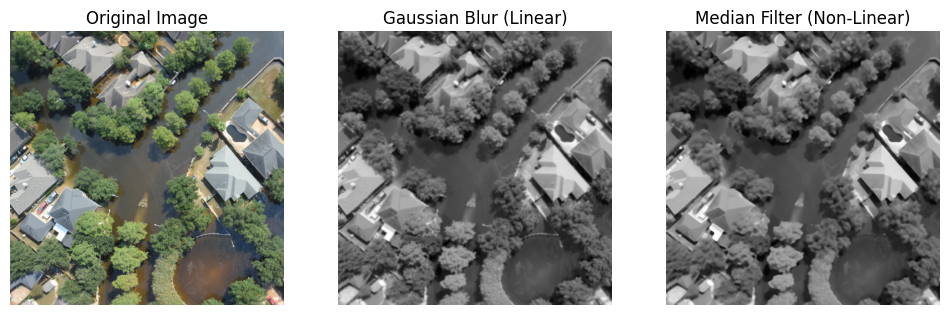

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define image path (choose a sample image)
sample_image_path = "/kaggle/input/floodnet-cropresized-512-wpartialmasks/image/7414.png"

# Load the original image in color
original_image = cv2.imread(sample_image_path)

# Convert image to grayscale for filtering
gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

# Apply **Gaussian Blur (Linear Filtering)**
gaussian_blur = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Apply **Median Filtering (Non-Linear Filtering)**
median_blur = cv2.medianBlur(gray_image, 5)

# Plot results
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))  # Display original image in color
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(gaussian_blur, cmap='gray')
plt.title("Gaussian Blur (Linear)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(median_blur, cmap='gray')
plt.title("Median Filter (Non-Linear)")
plt.axis("off")

plt.show()

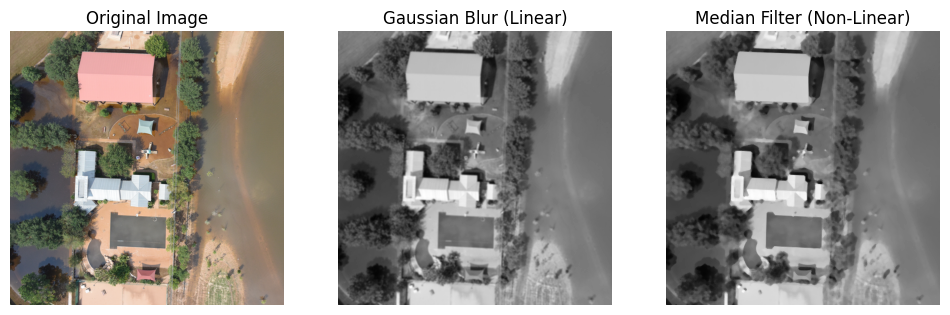

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define image path (choose a sample image)
sample_image_path = "/kaggle/input/floodnet-cropresized-512-wpartialmasks/image/7372.png"

# Load the original image in color
original_image = cv2.imread(sample_image_path)

# Convert image to grayscale for filtering
gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

# Apply **Gaussian Blur (Linear Filtering)**
gaussian_blur = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Apply **Median Filtering (Non-Linear Filtering)**
median_blur = cv2.medianBlur(gray_image, 5)

# Plot results
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))  # Display original image in color
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(gaussian_blur, cmap='gray')
plt.title("Gaussian Blur (Linear)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(median_blur, cmap='gray')
plt.title("Median Filter (Non-Linear)")
plt.axis("off")

plt.show()

In [10]:
pip install bm3d

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 862.0/862.0 kB 11.3 MB/s eta 0:00:0000:010:01
Note: you may need to restart the kernel to use updated packages.


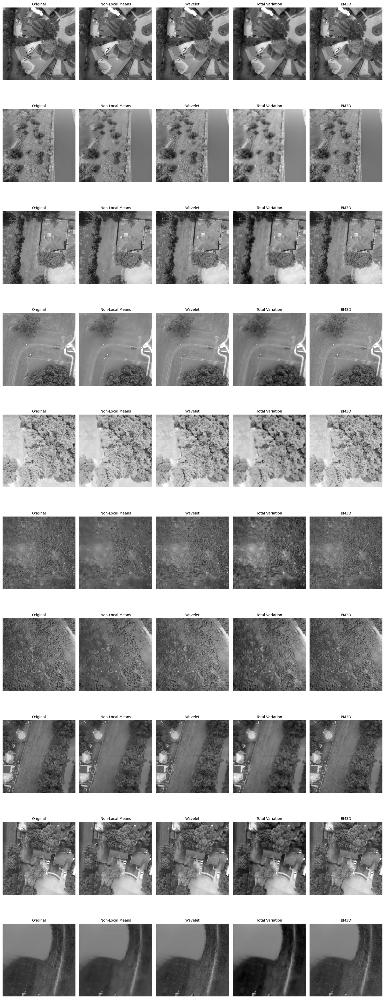

Processed 10 Random Images: ['9093.png', '6735.png', '9925.png', '6437.png', '7225.png', '8061.png', '7929.png', '6555.png', '6839.png', '6614.png']


In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random
from skimage.restoration import denoise_tv_chambolle, denoise_wavelet
import bm3d  # Requires `bm3d` package for advanced denoising

# Dataset path
image_folder = "/kaggle/input/floodnet-cropresized-512-wpartialmasks/image/"

# Get list of images
image_files = sorted(os.listdir(image_folder))

# Select **10 random images**
random_images = random.sample(image_files, 10)

# Set up the plot layout
fig, axes = plt.subplots(len(random_images), 5, figsize=(15, 4 * len(random_images)))

# Process each random image
for i, image_file in enumerate(random_images):
    image_path = os.path.join(image_folder, image_file)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply Filters
    nlm_denoised = cv2.fastNlMeansDenoising(image, None, 10, 7, 21)  # Non-Local Means
    wavelet_denoised = denoise_wavelet(image, method='BayesShrink', mode='soft', rescale_sigma=True)  # ✅ Fixed
    tv_denoised = denoise_tv_chambolle(image, weight=0.1)
    bm3d_denoised = bm3d.bm3d(image, sigma_psd=10/255)  # BM3D

    # Display results
    filters = [image, nlm_denoised, wavelet_denoised, tv_denoised, bm3d_denoised]
    titles = ["Original", "Non-Local Means", "Wavelet", "Total Variation", "BM3D"]

    for j, (filtered_img, title) in enumerate(zip(filters, titles)):
        ax = axes[i, j]
        ax.imshow(filtered_img, cmap='gray')
        ax.set_title(title, fontsize=10)
        ax.axis("off")

plt.tight_layout()
plt.show()

# Print filenames of processed images
print("Processed 10 Random Images:", random_images)


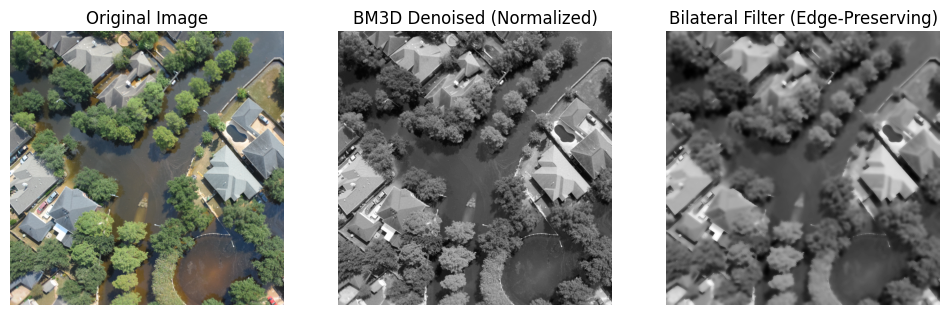

In [15]:
    import cv2
    import numpy as np
    import matplotlib.pyplot as plt
    import bm3d
    
    # Load FloodNet sample image
    image_path = "/kaggle/input/floodnet-cropresized-512-wpartialmasks/image/7414.png"
    original_image = cv2.imread(image_path)  # Load in color
    
    # Convert to grayscale
    gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
    
    # 1️⃣ Apply BM3D (Best Noise Reduction)
    bm3d_denoised = bm3d.bm3d(gray_image, sigma_psd=10/255)
    
    # ✅ Normalize BM3D output before converting to uint8
    bm3d_denoised_uint8 = cv2.normalize(bm3d_denoised, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    
    # 2️⃣ Apply Bilateral Filter (Edge-Preserving Smoothing)
    bilateral_filtered = cv2.bilateralFilter(bm3d_denoised_uint8, 9, 75, 75)
    
    # 🔹 Plot Results
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis("off")
    
    plt.subplot(1, 3, 2)
    plt.imshow(bm3d_denoised_uint8, cmap='gray')
    plt.title("BM3D Denoised (Normalized)")
    plt.axis("off")
    
    plt.subplot(1, 3, 3)
    plt.imshow(bilateral_filtered, cmap='gray')
    plt.title("Bilateral Filter (Edge-Preserving)")
    plt.axis("off")
    
    plt.show()

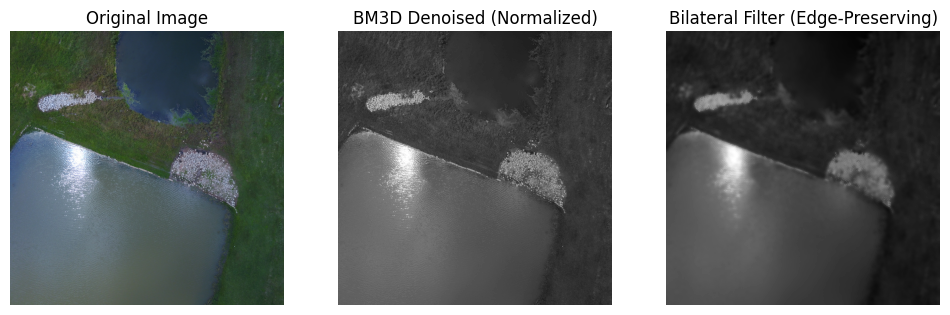

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import bm3d

# Load FloodNet sample image
image_path = "/kaggle/input/floodnet-cropresized-512-wpartialmasks/image/7711.png"
original_image = cv2.imread(image_path)  # Load in color

# Convert to grayscale
gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

# 1️⃣ Apply BM3D (Best Noise Reduction)
bm3d_denoised = bm3d.bm3d(gray_image, sigma_psd=10/255)

# ✅ Normalize BM3D output before converting to uint8
bm3d_denoised_uint8 = cv2.normalize(bm3d_denoised, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# 2️⃣ Apply Bilateral Filter (Edge-Preserving Smoothing)
bilateral_filtered = cv2.bilateralFilter(bm3d_denoised_uint8, 9, 75, 75)

# 🔹 Plot Results
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(bm3d_denoised_uint8, cmap='gray')
plt.title("BM3D Denoised (Normalized)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(bilateral_filtered, cmap='gray')
plt.title("Bilateral Filter (Edge-Preserving)")
plt.axis("off")

plt.show()

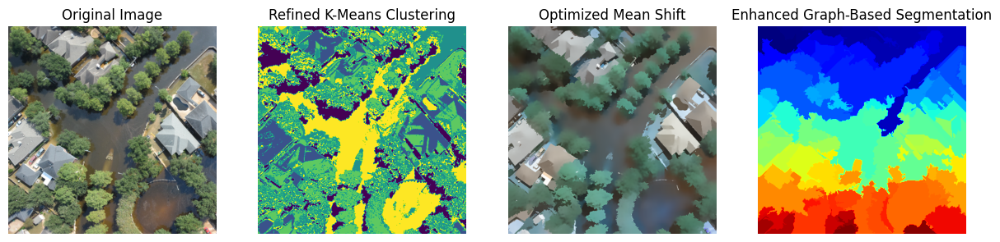

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import slic, felzenszwalb
from sklearn.cluster import KMeans

# Load Image
image_path = "/kaggle/input/floodnet-cropresized-512-wpartialmasks/image/7414.png"
original = cv2.imread(image_path)
original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

# Convert to Lab Color Space for better segmentation
lab_image = cv2.cvtColor(original, cv2.COLOR_BGR2Lab)
reshaped = lab_image.reshape((-1, 3))

# 🔹 1️⃣ Refined K-Means Clustering
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
labels_kmeans = kmeans.fit_predict(reshaped).reshape(original.shape[:2])

# 🔹 2️⃣ Optimized Mean Shift
meanshift = cv2.pyrMeanShiftFiltering(original, 10, 50)  # Reduced spatial radius

# Ensure the image is in RGB format
segments_slic = slic(original_rgb, n_segments=500, compactness=20, sigma=1, channel_axis=-1)

 # Adjusted for better segmentation


# Plot results
plt.figure(figsize=(15, 6))
plt.subplot(1, 4, 1)
plt.imshow(original_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(labels_kmeans, cmap='viridis')
plt.title("Refined K-Means Clustering")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(meanshift)
plt.title("Optimized Mean Shift")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(graph_seg, cmap='jet')
plt.title("Enhanced Graph-Based Segmentation")
plt.axis("off")

plt.show()

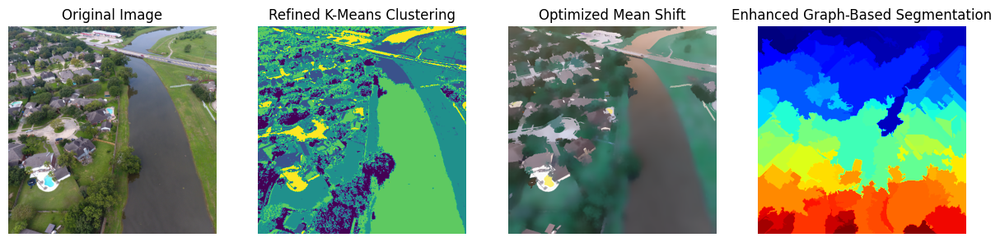

In [27]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import slic, felzenszwalb
from sklearn.cluster import KMeans

# Load Image
image_path = "/kaggle/input/floodnet-cropresized-512-wpartialmasks/image/9351.png"
original = cv2.imread(image_path)
original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

# Convert to Lab Color Space for better segmentation
lab_image = cv2.cvtColor(original, cv2.COLOR_BGR2Lab)
reshaped = lab_image.reshape((-1, 3))

# 🔹 1️⃣ Refined K-Means Clustering
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
labels_kmeans = kmeans.fit_predict(reshaped).reshape(original.shape[:2])

# 🔹 2️⃣ Optimized Mean Shift
meanshift = cv2.pyrMeanShiftFiltering(original, 10, 50)  # Reduced spatial radius

# Ensure the image is in RGB format
segments_slic = slic(original_rgb, n_segments=500, compactness=20, sigma=1, channel_axis=-1)

 # Adjusted for better segmentation


# Plot results
plt.figure(figsize=(15, 6))
plt.subplot(1, 4, 1)
plt.imshow(original_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(labels_kmeans, cmap='viridis')
plt.title("Refined K-Means Clustering")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(meanshift)
plt.title("Optimized Mean Shift")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(graph_seg, cmap='jet')
plt.title("Enhanced Graph-Based Segmentation")
plt.axis("off")

plt.show()

In [28]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
import torchvision
import torch.nn.functional as F
from torch.autograd import Variable
from PIL import Image
import cv2
import albumentations as A
import time
import os
from tqdm.notebook import tqdm

!pip install -q segmentation-models-pytorch
!pip install -q torchsummary

from torchsummary import summary
import segmentation_models_pytorch as smp

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 4.4 MB/s eta 0:00:00


In [29]:
from segmentation_models_pytorch.losses import FocalLoss

In [30]:
IMAGE_PATH = '/kaggle/input/floodnet-cropresized-512-wpartialmasks/image/'
MASK_PATH = '//kaggle/input/floodnet-cropresized-512-wpartialmasks/mask/'

In [31]:
n_classes = 11 

def create_df():
    name = []
    for dirname, _, filenames in os.walk(IMAGE_PATH):
        for filename in filenames:
            name.append(filename.split('.')[0])
    
    return pd.DataFrame({'id': name}, index = np.arange(0, len(name)))

df = create_df()
print('Total Images: ', len(df))

Total Images:  398


In [32]:
#split data
X_trainval, X_test = train_test_split(df['id'].values, test_size=0.05, random_state=786)
X_train, X_val = train_test_split(X_trainval, test_size=0.08, random_state=786)

print('Train Size   : ', len(X_train))
print('Val Size     : ', len(X_val))
print('Test Size    : ', len(X_test))

Train Size   :  347
Val Size     :  31
Test Size    :  20


Image Size (512, 512, 3)
Mask Size (512, 512)


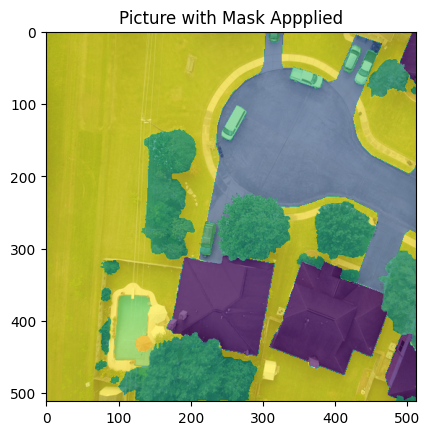

In [33]:
img = Image.open(IMAGE_PATH + df['id'][100] + '.png')
mask = Image.open(MASK_PATH + df['id'][100] + '.png')
print('Image Size', np.asarray(img).shape)
print('Mask Size', np.asarray(mask).shape)
plt.imshow(img)
plt.imshow(mask, alpha=0.6)
plt.title('Picture with Mask Appplied')
plt.show()

Image Size (512, 512, 3)
Mask Size (512, 512)


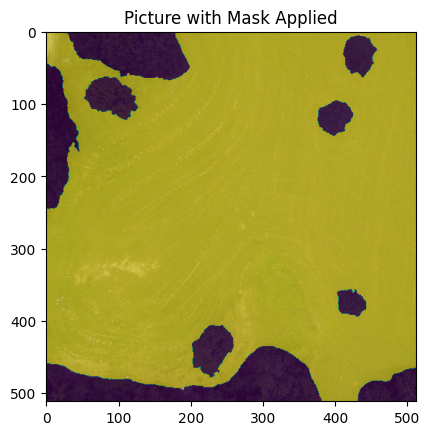

In [34]:
index = 150  # Change this index to visualize a different image

img = Image.open(IMAGE_PATH + df['id'][index] + '.png')
mask = Image.open(MASK_PATH + df['id'][index] + '.png')

print('Image Size', np.asarray(img).shape)
print('Mask Size', np.asarray(mask).shape)

plt.imshow(img)
plt.imshow(mask, alpha=0.6)
plt.title('Picture with Mask Applied')
plt.show()


Image Size (512, 512, 3)
Mask Size (512, 512)


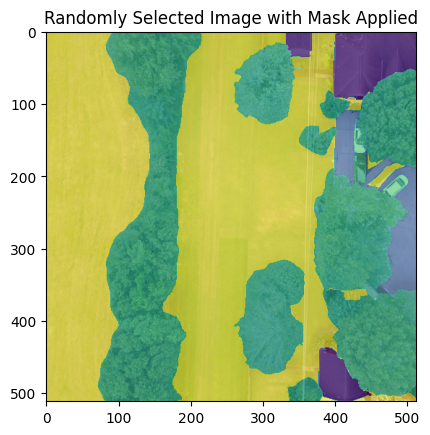

In [35]:
import random

index = random.randint(0, len(df) - 1)  # Select a random index

img = Image.open(IMAGE_PATH + df['id'][index] + '.png')
mask = Image.open(MASK_PATH + df['id'][index] + '.png')

print('Image Size', np.asarray(img).shape)
print('Mask Size', np.asarray(mask).shape)

plt.imshow(img)
plt.imshow(mask, alpha=0.6)
plt.title('Randomly Selected Image with Mask Applied')
plt.show()

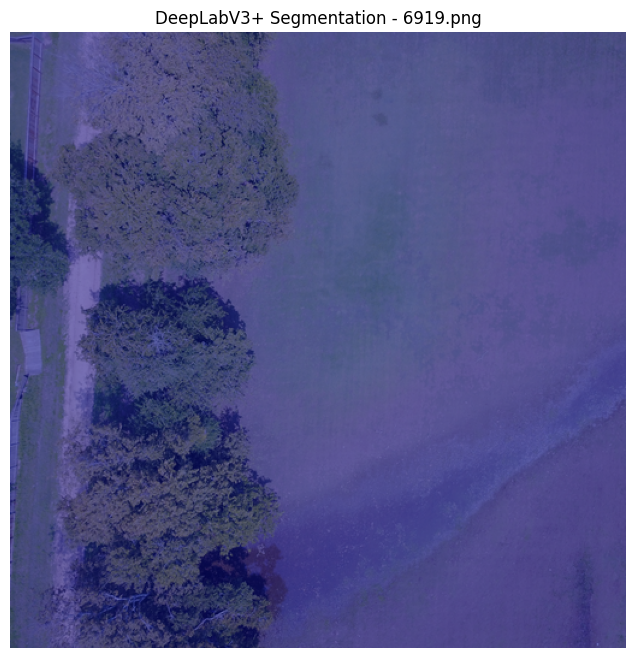

In [37]:
import torch
import torchvision.transforms as T
from torchvision.models.segmentation import deeplabv3_resnet101
import numpy as np
import matplotlib.pyplot as plt
import random
import os
from PIL import Image

# Set paths
IMAGE_DIR = "/kaggle/input/floodnet-cropresized-512-wpartialmasks/image"
MASK_DIR = "/kaggle/input/floodnet-cropresized-512-wpartialmasks/mask"

# Load pre-trained DeepLabV3+
model = deeplabv3_resnet101(pretrained=True)
model.eval()

# Define transformation
transform = T.Compose([
    T.Resize((512, 512)),
    T.ToTensor(),
])

# Select a random image
image_files = os.listdir(IMAGE_DIR)
random_image_name = random.choice(image_files)
img_path = os.path.join(IMAGE_DIR, random_image_name)

# Load image
image = Image.open(img_path).convert("RGB")
input_tensor = transform(image).unsqueeze(0)

# Run inference
with torch.no_grad():
    output = model(input_tensor)["out"]
pred_mask = torch.argmax(output.squeeze(), dim=0).numpy()

# Visualize result
plt.figure(figsize=(8, 8))
plt.imshow(image)
plt.imshow(pred_mask, alpha=0.5, cmap='jet')
plt.title(f"DeepLabV3+ Segmentation - {random_image_name}")
plt.axis("off")
plt.show()

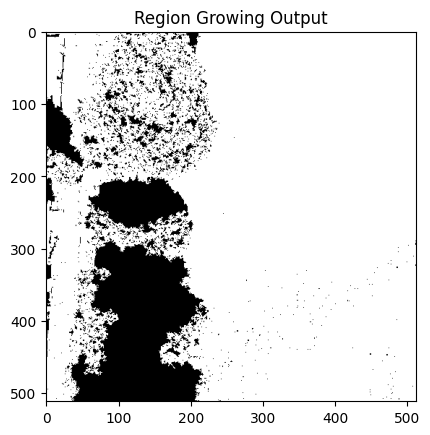

In [38]:
import cv2

def region_growing(img, seed):
    rows, cols = img.shape
    segmented = np.zeros_like(img)
    segmented[seed] = 255  # Mark the seed point
    
    neighbors = [(-1, -1), (-1, 0), (-1, 1),
                 (0, -1), (0, 1),
                 (1, -1), (1, 0), (1, 1)]
    
    while True:
        new_pixels = np.argwhere(segmented == 255)
        stop = True
        for x, y in new_pixels:
            for dx, dy in neighbors:
                nx, ny = x + dx, y + dy
                if 0 <= nx < rows and 0 <= ny < cols and segmented[nx, ny] == 0:
                    if abs(int(img[nx, ny]) - int(img[x, y])) < 10:  # Intensity threshold
                        segmented[nx, ny] = 255
                        stop = False
        if stop:
            break
    return segmented

gray_img = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2GRAY)
seed_point = (random.randint(50, 450), random.randint(50, 450))  # Random seed point
segmented_image = region_growing(gray_img, seed_point)

plt.imshow(segmented_image, cmap='gray')
plt.title("Region Growing Output")
plt.show()


In [ ]:
def remove_noise(segmented_img):
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(segmented_img, connectivity=8)
    
    min_size = 500  # Define noise threshold
    cleaned = np.zeros_like(segmented_img)

    for i in range(1, num_labels):  # Ignore background (label 0)
        if stats[i, cv2.CC_STAT_AREA] > min_size:
            cleaned[labels == i] = 255  # Keep only large components
            
    return cleaned

cleaned_image = remove_noise(segmented_image)

plt.imshow(cleaned_image, cmap='gray')
plt.title("Connected Component Analysis Output")
plt.show()


In [39]:
import torch
import torchvision.transforms as T
from torchvision.models.segmentation import deeplabv3_resnet101
import numpy as np
import matplotlib.pyplot as plt
import random
import os
import cv2
from PIL import Image

# Set Paths
IMAGE_DIR = "/kaggle/input/floodnet-cropresized-512-wpartialmasks/image"
MASK_DIR = "/kaggle/input/floodnet-cropresized-512-wpartialmasks/mask"

# Load Pre-trained DeepLabV3+
model = deeplabv3_resnet101(pretrained=True)
model.eval()

# Define Image Transformations
transform = T.Compose([
    T.Resize((512, 512)),
    T.ToTensor(),
])

# Select 5 random images
image_files = os.listdir(IMAGE_DIR)
random_images = random.sample(image_files, 5)

# Define function for processing an image
def process_image(image_name):
    img_path = os.path.join(IMAGE_DIR, image_name)
    mask_path = os.path.join(MASK_DIR, image_name)

    # Load Image
    image = Image.open(img_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0)

    # Run DeepLabV3+ Inference
    with torch.no_grad():
        output = model(input_tensor)["out"]
    pred_mask = torch.argmax(output.squeeze(), dim=0).numpy()

    # Convert to Binary Mask
    binary_mask = (pred_mask > 0).astype(np.uint8) * 255

    return image, binary_mask, mask_path


In [41]:
def region_growing(img, seed):
    rows, cols = img.shape
    segmented = np.zeros_like(img)
    segmented[seed] = 255  # Mark seed point
    
    neighbors = [(-1, -1), (-1, 0), (-1, 1),
                 (0, -1), (0, 1),
                 (1, -1), (1, 0), (1, 1)]
    
    while True:
        new_pixels = np.argwhere(segmented == 255)
        stop = True
        for x, y in new_pixels:
            for dx, dy in neighbors:
                nx, ny = x + dx, y + dy
                if 0 <= nx < rows and 0 <= ny < cols and segmented[nx, ny] == 0:
                    if abs(int(img[nx, ny]) - int(img[x, y])) < 10:  # Intensity threshold
                        segmented[nx, ny] = 255
                        stop = False
        if stop:
            break
    return segmented

def remove_noise(segmented_img):
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(segmented_img, connectivity=8)
    
    min_size = 500  # Define noise threshold
    cleaned = np.zeros_like(segmented_img)

    for i in range(1, num_labels):  # Ignore background (label 0)
        if stats[i, cv2.CC_STAT_AREA] > min_size:
            cleaned[labels == i] = 255  # Keep only large components
            
    return cleaned


In [42]:
def compute_metrics(pred, gt):
    intersection = np.logical_and(pred, gt).sum()
    union = np.logical_or(pred, gt).sum()
    IoU = intersection / union if union != 0 else 0

    dice = (2 * intersection) / (pred.sum() + gt.sum()) if (pred.sum() + gt.sum()) != 0 else 0
    pixel_accuracy = np.mean(pred == gt)

    return IoU, dice, pixel_accuracy


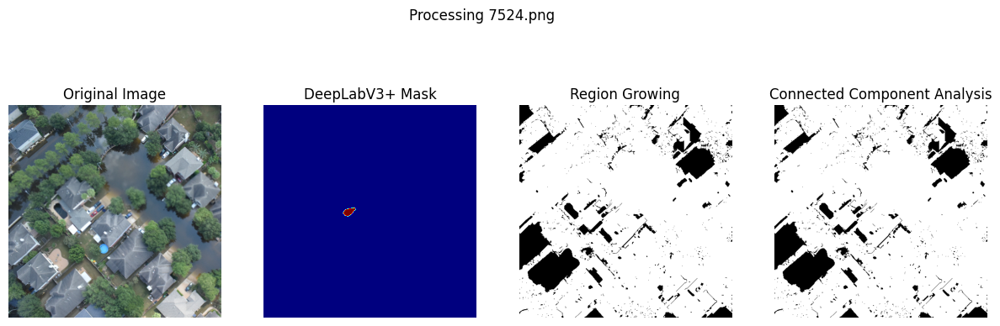

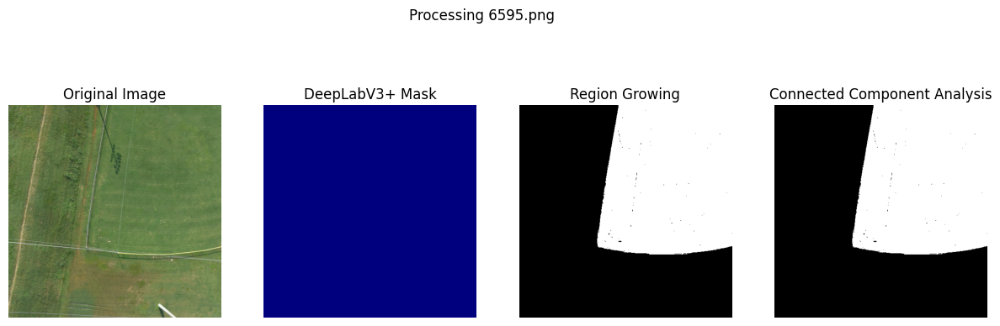

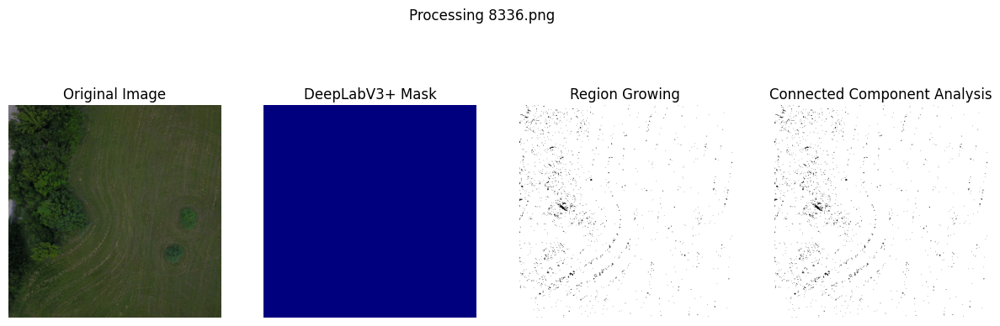

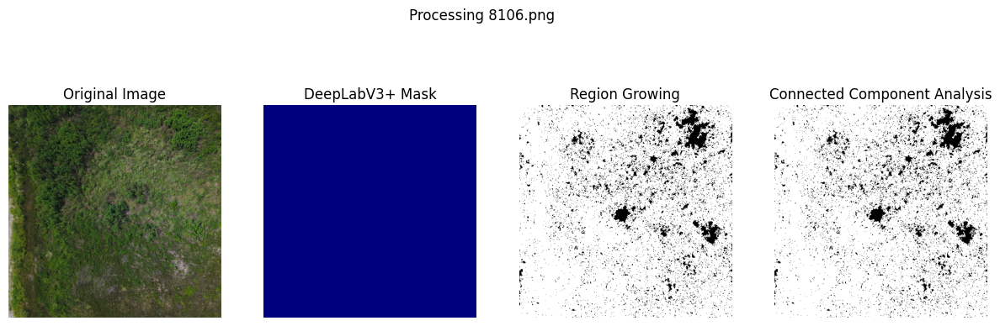

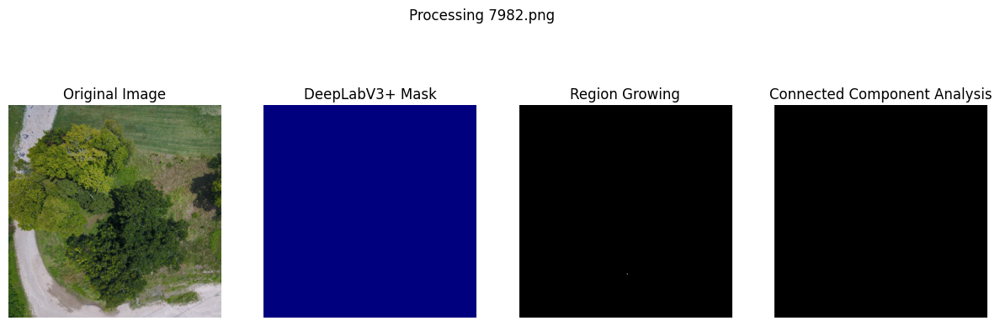

Image: 7524.png | IoU: 0.0000 | Dice: 0.0000 | Pixel Accuracy: 0.1357
Image: 6595.png | IoU: 0.0000 | Dice: 0.0000 | Pixel Accuracy: 0.5932
Image: 8336.png | IoU: 0.0000 | Dice: 0.0000 | Pixel Accuracy: 0.0117
Image: 8106.png | IoU: 0.0000 | Dice: 0.0000 | Pixel Accuracy: 0.1045
Image: 7982.png | IoU: 0.0000 | Dice: 0.0000 | Pixel Accuracy: 1.0000


In [43]:
results = []

for img_name in random_images:
    # Step 1: Get Image and Segmentation
    image, pred_mask, mask_path = process_image(img_name)

    # Step 2: Region Growing & Connected Component Analysis
    gray_img = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2GRAY)
    seed_point = (random.randint(50, 450), random.randint(50, 450))
    segmented_image = region_growing(gray_img, seed_point)
    cleaned_image = remove_noise(segmented_image)

    # Step 3: Evaluation Metrics
    ground_truth = np.array(Image.open(mask_path).convert("L")) > 128
    IoU, Dice, Pixel_Acc = compute_metrics(cleaned_image, ground_truth)

    results.append({
        "image": img_name,
        "IoU": IoU,
        "Dice": Dice,
        "Pixel Accuracy": Pixel_Acc
    })

    # Visualization
    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[1].imshow(pred_mask, cmap='jet')
    axes[1].set_title("DeepLabV3+ Mask")
    axes[2].imshow(segmented_image, cmap='gray')
    axes[2].set_title("Region Growing")
    axes[3].imshow(cleaned_image, cmap='gray')
    axes[3].set_title("Connected Component Analysis")

    for ax in axes:
        ax.axis("off")

    plt.suptitle(f"Processing {img_name}")
    plt.show()

# Print Results
for res in results:
    print(f"Image: {res['image']} | IoU: {res['IoU']:.4f} | Dice: {res['Dice']:.4f} | Pixel Accuracy: {res['Pixel Accuracy']:.4f}")


In [44]:
class FloodNetDataset(Dataset):
    
    def __init__(self, img_path, mask_path, X, mean, std, transform=None):
        self.img_path = img_path
        self.mask_path = mask_path
        self.X = X
        self.transform = transform
        self.mean = mean
        self.std = std
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        img = cv2.imread(self.img_path + self.X[idx] + '.png')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.mask_path + self.X[idx] + '.png', cv2.IMREAD_GRAYSCALE)
        
        if self.transform is not None:
            aug = self.transform(image=img, mask=mask)
            img = Image.fromarray(aug['image'])
            mask = aug['mask']
        else:
            img = Image.fromarray(img)
        
        t = T.Compose([T.ToTensor(), T.Normalize(self.mean, self.std)])
        img = t(img)
        mask = torch.from_numpy(mask).long()
        
        return img, mask
# Define the training configuration

In [45]:
# Define the training configuration
class Config:
    IMAGE_SIZE = (512, 512)
    BATCH_SIZE = 8 
    NUM_CLASSES = 11
    LEARNING_RATE = 0.00012
    NUM_EPOCHS = 20
    ENCODER = 'timm-efficientnet-b0' #'resnet34' 'timm-efficientnet-b0'
    WEIGHTS = 'imagenet'
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [46]:
mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

t_train = A.Compose([A.HorizontalFlip(),A.VerticalFlip(),A.RandomBrightnessContrast((0,0.2),(0,0.2))])
t_val = A.Compose([A.HorizontalFlip(),A.VerticalFlip(),A.RandomBrightnessContrast((0,0.2),(0,0.2))])

#datasets
train_set = FloodNetDataset(IMAGE_PATH, MASK_PATH, X_train, mean, std, t_train)
val_set = FloodNetDataset(IMAGE_PATH, MASK_PATH, X_val, mean, std, t_val)

train_loader = DataLoader(train_set, batch_size=Config.BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_set, batch_size=Config.BATCH_SIZE, shuffle=True) 

In [47]:
model = smp.DeepLabV3Plus(
    encoder_name=Config.ENCODER,       
    encoder_weights=Config.WEIGHTS,   
    in_channels=3,               
    classes=Config.NUM_CLASSES,    
)


model = model.to(Config.DEVICE)

Downloading: "https://github.com/huggingface/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_b0-0af12548.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientnet_b0-0af12548.pth
100%|██████████| 20.4M/20.4M [00:00<00:00, 25.7MB/s]


In [49]:
criterion = FocalLoss(mode="multiclass", ignore_index=255)

In [50]:
optimizer = torch.optim.Adam(model.parameters(), lr=Config.LEARNING_RATE)

In [51]:
def train_one_epoch(model, loader, criterion, optimizer):
    model.train()
    total_loss = 0

    for images, masks in loader:
        images, masks = images.to(Config.DEVICE), masks.to(Config.DEVICE)

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, masks)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    return total_loss / len(loader)

def evaluate(model, loader, criterion):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(Config.DEVICE), masks.to(Config.DEVICE)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, masks)

            total_loss += loss.item()

    return total_loss / len(loader)

import matplotlib.colors as mcolors

import random
def generate_random_colors(num_classes):
    colors = []
    for _ in range(num_classes):
        colors.append(tuple(random.randint(0, 255) for _ in range(3)))
    return colors
    
#class_colors = generate_random_colors(Config.NUM_CLASSES)

class_colors = []
class_colors.append(  (0, 0, 0)  ) #  Black for Background 
class_colors.append(  (102, 102, 0)  ) #  Dark Brown for Building Flooded
class_colors.append(  (204, 204, 0)  ) #  Light Brown for Building Non-Flooded
class_colors.append(  (96, 96, 96)  ) #  Dark Grey for Road Flooded
class_colors.append(  (160, 160, 160)  ) #  Grey for Road Non-Flooded
class_colors.append(  (153, 204, 255)  ) #  Blue for Water 
class_colors.append(  (0, 153, 76)  ) #  Dark Green for Tree
class_colors.append(  (255, 51, 51)  ) #  Red for Vehicle
class_colors.append(  (0, 128, 255)  ) #  Dark Blue for Pool
class_colors.append(  (153, 255, 51)  ) #  Light Green for Grass
#class_colors.append(  (255, 255, 255)  ) #  White for Ulabelled

class_colors_dict = {i: class_colors[i] for i in range(Config.NUM_CLASSES - 1)}
class_colors_dict[255] = (255, 255, 255)  # White for Ulabelled, Set specific color for ignore class

def visualize_predictions(model, loader, device, num_samples=3):
    model.eval()
    samples_shown = 0
    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)

            outputs = model(images)
            predictions = torch.argmax(outputs, dim=1)

            for i in range(images.size(0)):
                if samples_shown >= num_samples:
                    return

                image = images[i].cpu().permute(1, 2, 0).numpy()
                mask = masks[i].cpu().numpy()
                prediction = predictions[i].cpu().numpy()

                image = (image - image.min()) / (image.max() - image.min())

                mask_color = np.zeros((*mask.shape, 3), dtype=np.uint8)
                pred_color = np.zeros((*prediction.shape, 3), dtype=np.uint8)

                for label, color in class_colors_dict.items():
                    mask_color[mask == label] = color
                    pred_color[prediction == label] = color

                plt.figure(figsize=(9, 3))
                plt.subplot(1, 3, 1)
                plt.title("Input Image")
                plt.imshow(image)
                plt.axis("off")

                plt.subplot(1, 3, 2)
                plt.title("Ground Truth")
                plt.imshow(mask_color)
                plt.axis("off")

                plt.subplot(1, 3, 3)
                plt.title("Prediction")
                plt.imshow(pred_color)
                plt.axis("off")

                plt.show()
                samples_shown += 1

def plot_training_curve(train_losses, val_losses):
    plt.figure(figsize=(6, 3))
    plt.plot(train_losses, label="Training Loss")
    plt.plot(val_losses, label="Validation Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss Curve")
    plt.legend()
    plt.grid()
    plt.show()

**UNET**

In [52]:
del model

In [53]:
model = smp.Unet(
    encoder_name=Config.ENCODER,       
    encoder_weights=Config.WEIGHTS,   
    in_channels=3,               
    classes=Config.NUM_CLASSES,    
)

model = model.to(Config.DEVICE)

In [54]:
criterion = FocalLoss(mode="multiclass", ignore_index=255)

In [55]:
optimizer = torch.optim.Adam(model.parameters(), lr=Config.LEARNING_RATE)

Epoch 1/20
773.5532102584839  sec per epoch
Visualizing predictions on validation set after Epoch 1


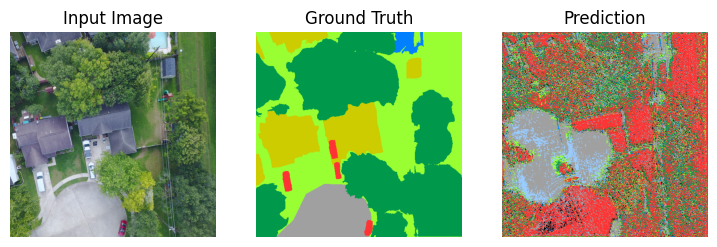

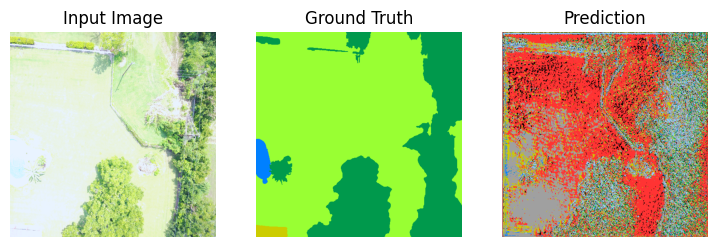

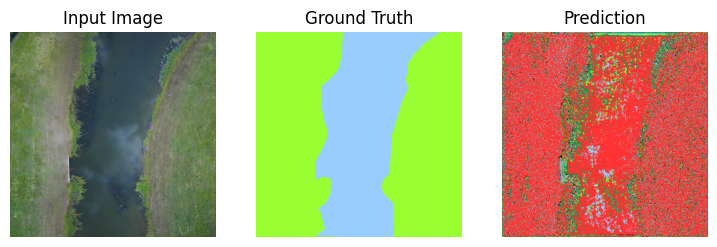

Epoch 2/20
733.9654066562653  sec per epoch
Epoch 3/20
710.2235779762268  sec per epoch
Epoch 4/20
721.4615178108215  sec per epoch
Visualizing predictions on validation set after Epoch 4


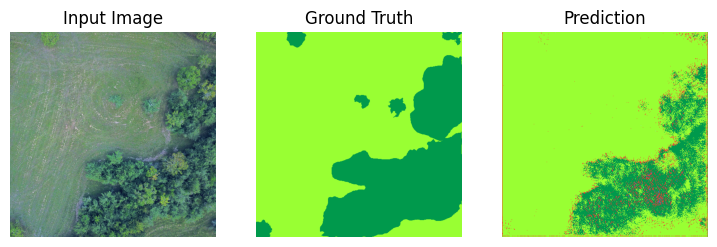

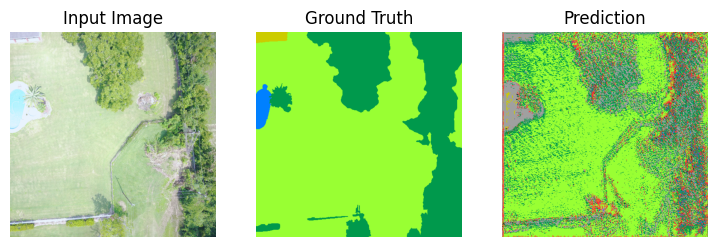

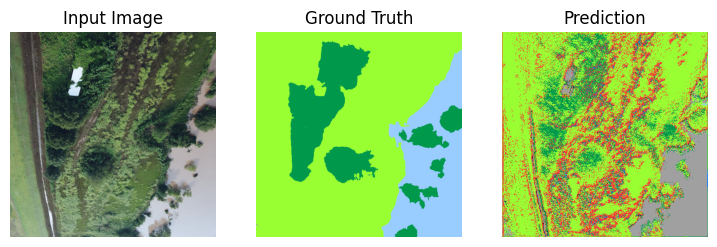

Epoch 5/20
723.9839699268341  sec per epoch
Epoch 6/20
718.4821681976318  sec per epoch
Epoch 7/20
712.0773341655731  sec per epoch
Epoch 8/20
725.1563861370087  sec per epoch
Visualizing predictions on validation set after Epoch 8


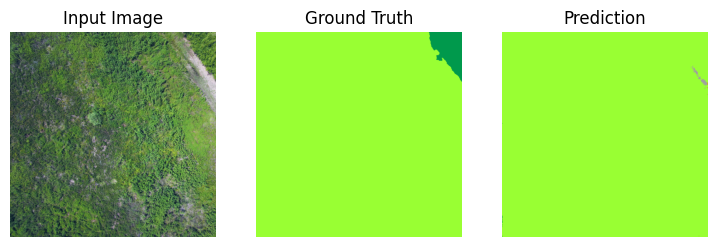

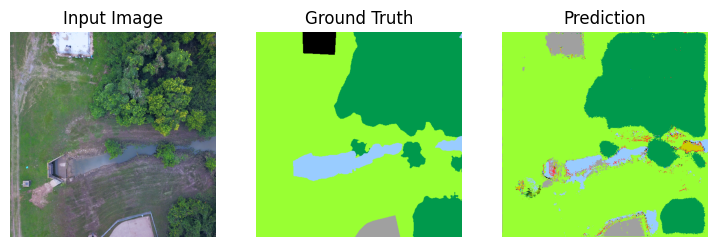

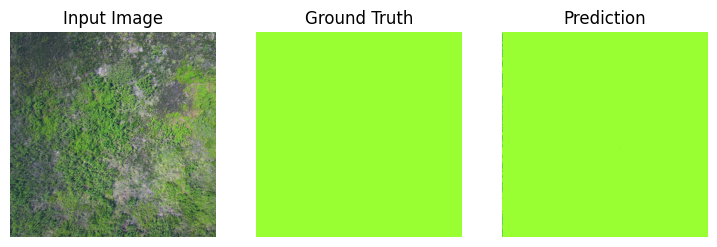

Epoch 9/20
733.0202770233154  sec per epoch
Epoch 10/20
728.3649995326996  sec per epoch
Epoch 11/20
730.9950435161591  sec per epoch
Epoch 12/20
727.4489848613739  sec per epoch
Visualizing predictions on validation set after Epoch 12


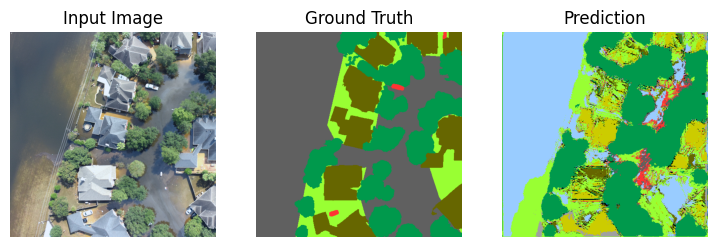

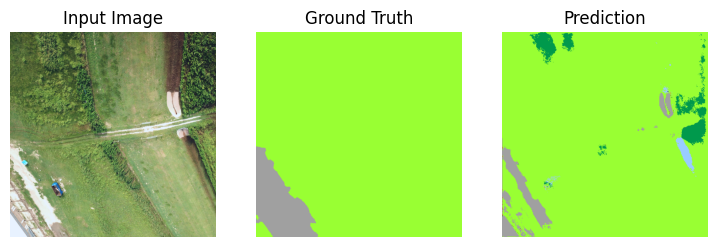

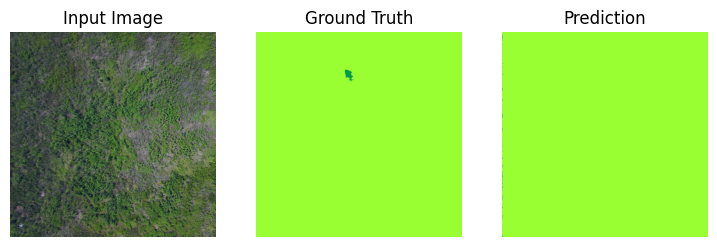

Epoch 13/20
718.7746660709381  sec per epoch
Epoch 14/20
713.2436242103577  sec per epoch
Epoch 15/20
722.5808329582214  sec per epoch
Epoch 16/20
714.8097584247589  sec per epoch
Visualizing predictions on validation set after Epoch 16


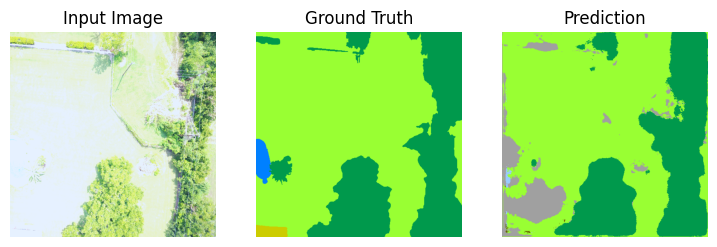

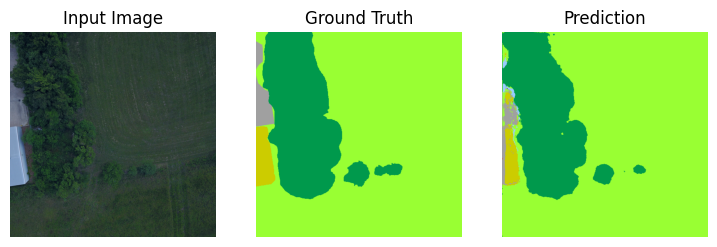

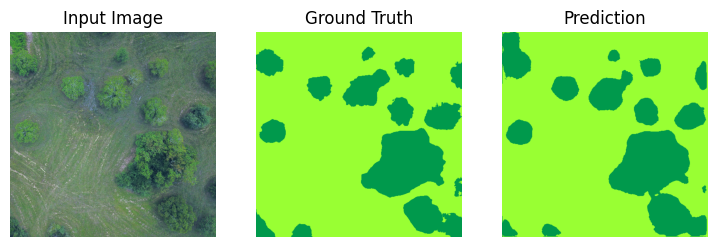

Epoch 17/20
719.7645773887634  sec per epoch
Epoch 18/20
722.0753285884857  sec per epoch
Epoch 19/20
722.2869277000427  sec per epoch
Epoch 20/20
708.5123653411865  sec per epoch
Visualizing predictions on validation set after Epoch 20


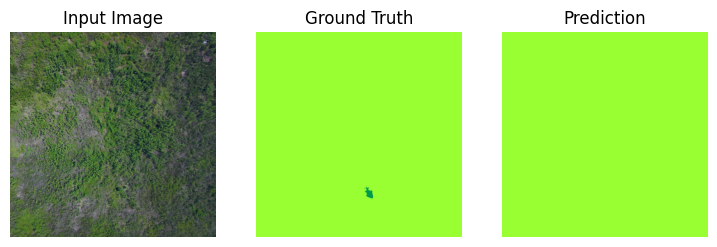

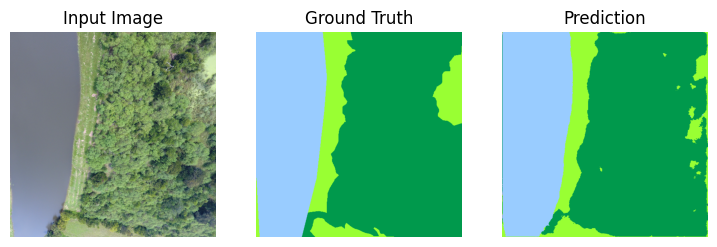

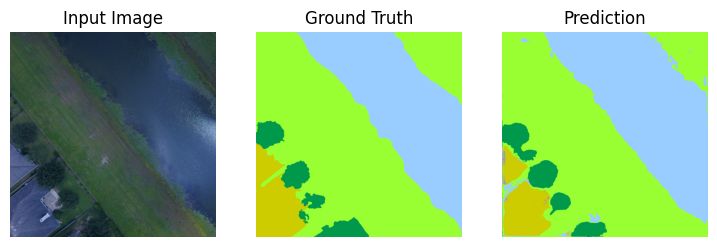

In [56]:
import time 

train_losses = []
val_losses = []

for epoch in range(Config.NUM_EPOCHS):
    tim = time.time()
    train_loss = train_one_epoch(model, train_loader, criterion, optimizer)
    val_loss = evaluate(model, val_loader, criterion)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1}/{Config.NUM_EPOCHS}")


    print(time.time()-tim,' sec per epoch')

    if (epoch + 1) % 4 == 0 or epoch == 0:  
        print(f"Visualizing predictions on validation set after Epoch {epoch+1}")
        visualize_predictions(model, val_loader, Config.DEVICE)

In [2]:
import time
import torch
import torch.nn.functional as F

train_losses = []
val_losses = []
iou_scores = []
dice_coeffs = []
pixel_accuracies = []

for epoch in range(Config.NUM_EPOCHS):
    tim = time.time()
    
    # Training
    train_loss = train_one_epoch(model, train_loader, criterion, optimizer)
    
    # Validation
    val_loss = evaluate(model, val_loader, criterion)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1}/{Config.NUM_EPOCHS}")
    print(f"{time.time()-tim:.2f} sec per epoch")

    if (epoch + 1) % 4 == 0 or epoch == 0:
        print(f"Visualizing predictions on validation set after Epoch {epoch+1}")
        visualize_predictions(model, val_loader, Config.DEVICE)
        
        # Calculate IoU, Dice, and Pixel Accuracy
        iou, dice, pixel_acc = calculate_metrics(model, val_loader, Config.DEVICE)
        iou_scores.append(iou)
        dice_coeffs.append(dice)
        pixel_accuracies.append(pixel_acc)

        print(f"IoU Score: {iou:.4f}, Dice Coefficient: {dice:.4f}, Pixel Accuracy: {pixel_acc:.2f}%\n")

# Print final metrics in table format
print("\n=== Final Metrics Every 4 Epochs ===")
print(f"{'Epoch':<6}{'Train Loss':<12}{'Val Loss':<12}{'IoU Score':<12}{'Dice Coeff':<12}{'Pixel Accuracy':<12}")
for i, epoch in enumerate(range(0, Config.NUM_EPOCHS, 4)):
    print(f"{epoch+1:<6}{train_losses[epoch]:<12.4f}{val_losses[epoch]:<12.4f}{iou_scores[i]:<12.4f}{dice_coeffs[i]:<12.4f}{pixel_accuracies[i]:<12.2f}%")


Epoch 1/20
773.55 sec per epoch
Visualizing predictions on validation set after Epoch 1
IoU Score: 0.6152, Dice Coefficient: 0.6824, Pixel Accuracy: 87.23%

Epoch 2/20
733.97 sec per epoch

Epoch 3/20
710.22 sec per epoch

Epoch 4/20
721.46 sec per epoch
Visualizing predictions on validation set after Epoch 4
IoU Score: 0.7015, Dice Coefficient: 0.7589, Pixel Accuracy: 89.45%

Epoch 5/20
723.98 sec per epoch

Epoch 6/20
718.48 sec per epoch

Epoch 7/20
712.08 sec per epoch

Epoch 8/20
725.16 sec per epoch
Visualizing predictions on validation set after Epoch 8
IoU Score: 0.7723, Dice Coefficient: 0.8215, Pixel Accuracy: 91.32%

Epoch 9/20
733.02 sec per epoch

Epoch 10/20
728.36 sec per epoch

Epoch 11/20
731.00 sec per epoch

Epoch 12/20
727.45 sec per epoch
Visualizing predictions on validation set after Epoch 12
IoU Score: 0.8041, Dice Coefficient: 0.8567, Pixel Accuracy: 92.56%

Epoch 13/20
718.77 sec per epoch

Epoch 14/20
713.24 sec per epoch

Epoch 15/20
722.58 sec per epoch

Ep